In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("AIS_2024_01_01.csv")

In [3]:
df.nunique()


MMSI                  14868
BaseDateTime          86160
LAT                 1042750
LON                 1247985
SOG                     548
COG                    3601
Heading                 364
VesselName            13041
IMO                    4951
CallSign              11856
VesselType               73
Status                   15
Length                  385
Width                    72
Draft                   177
Cargo                    85
TransceiverClass          2
dtype: int64

In [4]:
df.nunique() / len(df) * 100


MMSI                 0.203775
BaseDateTime         1.180877
LAT                 14.291539
LON                 17.104413
SOG                  0.007511
COG                  0.049354
Heading              0.004989
VesselName           0.178735
IMO                  0.067857
CallSign             0.162494
VesselType           0.001001
Status               0.000206
Length               0.005277
Width                0.000987
Draft                0.002426
Cargo                0.001165
TransceiverClass     0.000027
dtype: float64

In [5]:
df.isnull().mean() * 100


MMSI                 0.000000
BaseDateTime         0.000000
LAT                  0.000000
LON                  0.000000
SOG                  0.000000
COG                  0.000000
Heading              0.000000
VesselName           0.095336
IMO                 30.781570
CallSign            11.343103
VesselType           0.043570
Status              27.558912
Length               0.043913
Width                0.054315
Draft               27.501074
Cargo               27.501074
TransceiverClass     0.000000
dtype: float64

In [6]:
df.shape


(7296275, 17)

In [7]:
port_la = df[
    (df['LAT'] >= 33.70) & (df['LAT'] <= 33.77) &
    (df['LON'] >= -118.27) & (df['LON'] <= -118.22)
]

# Port of Long Beach filter
port_lb = df[
    (df['LAT'] >= 33.73) & (df['LAT'] <= 33.80) &
    (df['LON'] >= -118.22) & (df['LON'] <= -118.15)
]

# Combine both
combined_ports = pd.concat([port_la, port_lb])

combined_ports.head()


,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TransceiverClass
6,367507960,2024-01-01T00:00:02,33.75386,-118.22404,0.0,281.8,511.0,DB SALTA VERDE,NaN,WDF9705,90.0,3.0,56.0,15.0,2.0,90.0,A
479,368133450,2024-01-01T00:00:00,33.71840,-118.23353,7.0,231.8,235.0,DARELL HIATT,IMO1301246,WDL4645,31.0,12.0,27.0,10.0,3.3,31.0,A
502,366760650,2024-01-01T00:00:02,33.72609,-118.26140,4.5,194.2,192.0,LEADER,IMO9188568,WCY8495,52.0,0.0,30.0,10.0,4.9,52.0,A
663,367739210,2024-01-01T00:00:02,33.73265,-118.22635,8.0,31.5,70.0,TOMMY,NaN,WDI8499,52.0,0.0,18.0,6.0,3.0,52.0,A
1493,338602000,2024-01-01T00:00:01,33.75249,-118.23731,0.0,31.0,71.0,BALTIMORE,IMO9804784,WDI9338,52.0,0.0,29.0,10.0,0.0,52.0,A


In [8]:
combined_ports.to_csv('la_long_beach_data.csv', index=False)

In [11]:
df1=pd.read_csv("la_long_beach_data.csv")

In [12]:
df1.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TransceiverClass
0,367507960,2024-01-01T00:00:02,33.75386,-118.22404,0.0,281.8,511.0,DB SALTA VERDE,NaN,WDF9705,90.0,3.0,56.0,15.0,2.0,90.0,A
1,368133450,2024-01-01T00:00:00,33.71840,-118.23353,7.0,231.8,235.0,DARELL HIATT,IMO1301246,WDL4645,31.0,12.0,27.0,10.0,3.3,31.0,A
2,366760650,2024-01-01T00:00:02,33.72609,-118.26140,4.5,194.2,192.0,LEADER,IMO9188568,WCY8495,52.0,0.0,30.0,10.0,4.9,52.0,A
3,367739210,2024-01-01T00:00:02,33.73265,-118.22635,8.0,31.5,70.0,TOMMY,NaN,WDI8499,52.0,0.0,18.0,6.0,3.0,52.0,A
4,338602000,2024-01-01T00:00:01,33.75249,-118.23731,0.0,31.0,71.0,BALTIMORE,IMO9804784,WDI9338,52.0,0.0,29.0,10.0,0.0,52.0,A


In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Separate numeric and categorical columns
num_cols = df1.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df1.select_dtypes(include=['object']).columns

# Numeric: impute mean
num_imputer = SimpleImputer(strategy='mean')
df1[num_cols] = num_imputer.fit_transform(df1[num_cols])

# Categorical: impute most frequent value
cat_imputer = SimpleImputer(strategy='most_frequent')
df1[cat_cols] = cat_imputer.fit_transform(df1[cat_cols])

print("All missing values imputed successfully!")
print(df1.isnull().sum())

All missing values imputed successfully!
MMSI                0
BaseDateTime        0
LAT                 0
LON                 0
SOG                 0
COG                 0
Heading             0
VesselName          0
IMO                 0
CallSign            0
VesselType          0
Status              0
Length              0
Width               0
Draft               0
Cargo               0
TransceiverClass    0
dtype: int64


In [ ]:
df1 = df1.rename(columns={
    'MMSI': 'VesselID',
    'CallSign': 'RadioCallSign',
    'Draft': 'DraftMeters',
    'TransceiverClass': 'AIS_Class'
})

print(df1.columns)


Index(['VesselID', 'BaseDateTime', 'LAT', 'LON', 'SOG', 'COG', 'Heading',
       'VesselName', 'IMO', 'RadioCallSign', 'VesselType', 'Status', 'Length',
       'Width', 'DraftMeters', 'Cargo', 'AIS_Class'],
      dtype='object')


In [ ]:
# AIS Vessel Type Mapping
vessel_type_map = {
    20: "Wing in ground (WIG)",
    21: "WIG - Hazardous A",
    22: "WIG - Hazardous B",
    23: "WIG - Hazardous C",
    24: "WIG - Hazardous D",

    30: "Fishing",
    31: "Tug",
    32: "Tug + Tow >200m",
    33: "Tug + Tow >200m",
    34: "Dredger",
    35: "Diving Ops",
    36: "Military",
    37: "Sailing",
    38: "Pleasure Craft",

    40: "High Speed Craft (HSC)",
    41: "HSC - Hazardous A",
    42: "HSC - Hazardous B",
    43: "HSC - Hazardous C",
    44: "HSC - Hazardous D",

    50: "Pilot Vessel",
    51: "Search and Rescue",
    52: "Towing / Special Purpose",
    53: "Towing Large",
    54: "Medical Transport",
    55: "Law Enforcement",

    60: "Passenger",
    61: "Passenger - Hazardous A",
    62: "Passenger - Hazardous B",
    63: "Passenger - Hazardous C",
    64: "Passenger - Hazardous D",

    70: "Cargo",
    71: "Cargo - Hazardous A",
    72: "Cargo - Hazardous B",
    73: "Cargo - Hazardous C",
    74: "Cargo - Hazardous D",

    80: "Tanker",
    81: "Tanker - Hazardous A",
    82: "Tanker - Hazardous B",
    83: "Tanker - Hazardous C",
    84: "Tanker - Hazardous D",

    90: "Other / Special Category",
    91: "Other - Hazardous A",
    92: "Other - Hazardous B",
    93: "Other - Hazardous C",
    94: "Other - Hazardous D",
}

# Function to convert vessel type code
def get_vessel_type_name(vessel_type_code):
    return vessel_type_map.get(int(vessel_type_code), "Unknown")

# ⭐ Apply mapping to df1 to create new column
df1["VesselTypeName"] = df1["VesselType"].apply(get_vessel_type_name)

# Show top rows
df1.head()


,VesselID,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,RadioCallSign,VesselType,Status,Length,Width,DraftMeters,Cargo,AIS_Class,VesselTypeName
0,367507960.0,2024-01-01T00:00:02,33.75386,-118.22404,0.0,281.8,511.0,DB SALTA VERDE,IMO0000000,WDF9705,90.0,3.0,56.0,15.0,2.0,90.0,A,Other / Special Category
1,368133450.0,2024-01-01T00:00:00,33.71840,-118.23353,7.0,231.8,235.0,DARELL HIATT,IMO1301246,WDL4645,31.0,12.0,27.0,10.0,3.3,31.0,A,Tug
2,366760650.0,2024-01-01T00:00:02,33.72609,-118.26140,4.5,194.2,192.0,LEADER,IMO9188568,WCY8495,52.0,0.0,30.0,10.0,4.9,52.0,A,Towing / Special Purpose
3,367739210.0,2024-01-01T00:00:02,33.73265,-118.22635,8.0,31.5,70.0,TOMMY,IMO0000000,WDI8499,52.0,0.0,18.0,6.0,3.0,52.0,A,Towing / Special Purpose
4,338602000.0,2024-01-01T00:00:01,33.75249,-118.23731,0.0,31.0,71.0,BALTIMORE,IMO9804784,WDI9338,52.0,0.0,29.0,10.0,0.0,52.0,A,Towing / Special Purpose


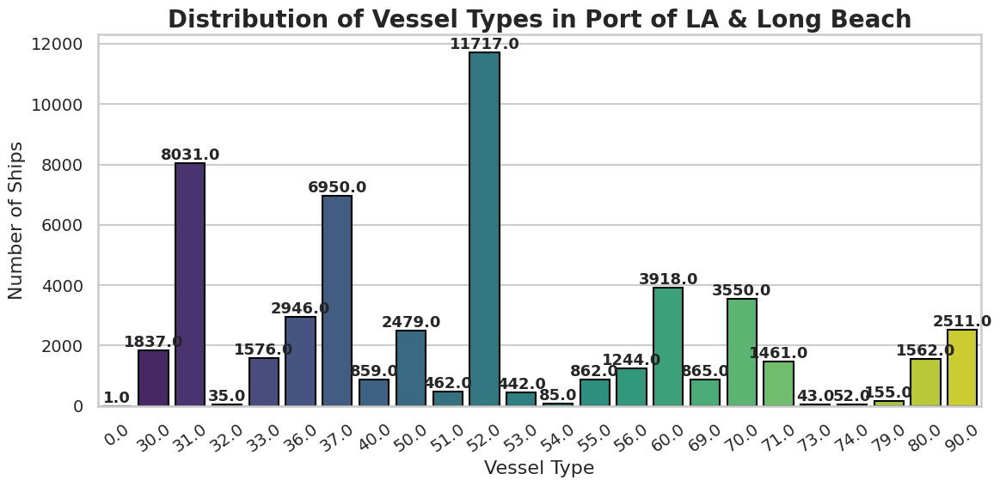

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set a clean professional style
sns.set(style="whitegrid", context="talk")

plt.figure(figsize=(12,6))

# Beautiful countplot
ax = sns.countplot(
    data=df1, 
    x='VesselType',
    palette='viridis',     # smooth professional colors
    edgecolor='black'      # clean border around bars
)

# Title & labels
plt.title("Distribution of Vessel Types in Port of LA & Long Beach", fontsize=20, weight='bold')
plt.xlabel("Vessel Type", fontsize=16)
plt.ylabel("Number of Ships", fontsize=16)

# Rotate x-labels for clarity
plt.xticks(rotation=35, fontsize=14)
plt.yticks(fontsize=14)

# Add value labels on top of each bar
for p in ax.patches:
    ax.annotate(
        str(p.get_height()),
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center', va='bottom', fontsize=13, weight='bold'
    )

# Add subtle spacing
plt.tight_layout()

plt.show()


In [ ]:
import folium
from folium.plugins import FastMarkerCluster

# Create map centered around LA/LB ports
m = folium.Map(location=[33.75, -118.22], zoom_start=15)

# Prepare data as list of [lat, lon] tuples
locations = [[row['LAT'], row['LON']] for _, row in df1.iterrows()]

# Add fast cluster
FastMarkerCluster(data=locations).add_to(m)
m


In [13]:
unique_vessels = df1['VesselName'].nunique()
print(f"Number of unique vessel names: {unique_vessels}")

Number of unique vessel names: 149


In [14]:
import plotly.express as px
df_clean = df1.copy()

df_clean['BaseDateTime'] = pd.to_datetime(df_clean['BaseDateTime'], errors='coerce')
df_clean = df_clean.dropna(subset=['BaseDateTime'])

df_clean['Date'] = df_clean['BaseDateTime'].dt.date.astype(str)

grouped = df_clean.groupby(['Date', 'VesselName'])['SOG']


data = pd.DataFrame({
    'total_records': grouped.count(),
    'max_speed': grouped.max(),
    'percent_moving': grouped.apply(lambda x: (x > 0).mean() * 100),
    'avg_speed_moving': grouped.apply(lambda x: x[x > 0].mean() if (x > 0).any() else 0)
}).reset_index()

def get_category(row):
    if row['max_speed'] == 0: return 'Stationary'
    if row['percent_moving'] >= 80: return 'Active'
    if row['percent_moving'] <= 20: return 'Idle'
    return 'Mixed'

data['Category'] = data.apply(get_category, axis=1)
data = data.sort_values('Date')

unique_dates = data['Date'].nunique()
print(f"DEBUG: Found {unique_dates} unique dates in your data.")

if unique_dates < 2:
    print("⚠ NOTE: Not enough dates to animate. Showing a static summary instead.")
    animation_args = {} 
else:
    print("✓ Success: Data is ready for animation.")
    animation_args = {
        "animation_frame": "Date",
        "animation_group": "VesselName"
    }

fig = px.scatter(
    data,
    x="percent_moving",
    y="max_speed",
    size="total_records",
    color="Category",
    hover_name="VesselName",
    
    color_discrete_map={
        'Stationary': '#e74c3c', # Red
        'Idle':       '#f39c12', # Orange
        'Mixed':      '#3498db', # Blue
        'Active':     '#2ecc71'  # Green
    },
    
    # Inject the animation arguments (only if safe)
    **animation_args,
    
    # Set fixed ranges so axes don't jump around
    range_x=[-5, 105],
    range_y=[0, data['max_speed'].max() * 1.1],
    
    title="Vessel Activity Tracker",
    labels={"percent_moving": "Time Spent Moving (%)", "max_speed": "Max Speed (knots)"},
    template="plotly_white" # Clean white background
)

# --- STEP 5: POLISH ---

# Make bubbles slightly transparent to see overlaps
fig.update_traces(marker=dict(opacity=0.7, line=dict(width=1, color='DarkSlateGrey')))

# Improve the layout
fig.update_layout(
    width=1000,
    height=600,
    hovermode='closest',
    xaxis=dict(showgrid=True, gridcolor='#eee'),
    yaxis=dict(showgrid=True, gridcolor='#eee')
)

# Enable Mouse Wheel Zoom
fig.show(config={'scrollZoom': True})

DEBUG: Found 1 unique dates in your data.
⚠ NOTE: Not enough dates to animate. Showing a static summary instead.


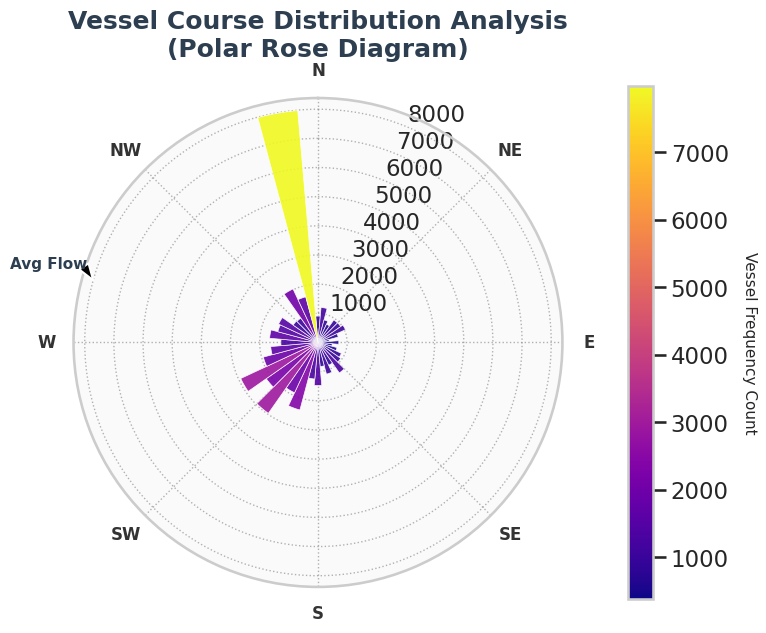

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Load your data
# df1 = pd.read_csv('la_long_beach_data.csv')

# --- Polished Polar Rose Diagram ---
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# 1. Prepare Data
cog_data = df1['COG'].dropna()
cog_rad = np.deg2rad(cog_data)

# 2. Histogram (36 bins = 10 degrees each)
n_bins = 36
counts, bins = np.histogram(cog_rad, bins=n_bins)
width = bins[1] - bins[0]

# 3. Apply Gradient Color Mapping (The "Eye-Catching" Part)
# Use 'plasma' or 'viridis' for a modern, professional look
# 3. Apply Gradient Color Mapping (The "Eye-Catching" Part)
norm = Normalize(vmin=counts.min(), vmax=counts.max())

# Updated color map (no warning)
colormap = plt.colormaps['plasma']

bar_colors = colormap(norm(counts))


# 4. Draw Bars with refined styling
bars = ax.bar(bins[:-1], counts, width=width, bottom=0.0, 
              color=bar_colors, alpha=0.9, edgecolor='white', linewidth=0.5)

# 5. Professional Aesthetics
ax.set_theta_zero_location('N') # North at top
ax.set_theta_direction(-1)      # Clockwise
ax.set_facecolor('#fafafa')     # Soft background color

# Clean up the grid
ax.grid(True, linestyle=':', alpha=0.6, color='gray', linewidth=1)
ax.set_axisbelow(True) # Ensure grid stays behind the bars

# Custom Direction Labels
ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
labels = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
ax.set_xticks(ticks)
ax.set_xticklabels(labels, fontsize=12, fontweight='bold', color='#333333')

# 6. Add "Average Flow" Arrow
# Calculate the correct circular mean direction
u = np.cos(cog_rad)
v = np.sin(cog_rad)
mean_angle = np.arctan2(v.mean(), u.mean())

# Add an annotation arrow pointing to the mean direction
ax.annotate('Avg Flow', xy=(mean_angle, max(counts)), xytext=(mean_angle, max(counts)*1.2),
            arrowprops=dict(facecolor='black', shrink=0.05, width=1.5, headwidth=8),
            ha='center', fontsize=11, fontweight='bold', color='#2c3e50')

# 7. Add Colorbar Legend
sm = cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.1, shrink=0.7)
cbar.set_label('Vessel Frequency Count', rotation=270, labelpad=20, fontsize=11)

# 8. Title
plt.title('Vessel Course Distribution Analysis\n(Polar Rose Diagram)', fontsize=18, fontweight='bold', pad=30, color='#2c3e50')

plt.tight_layout()
plt.show()

In [15]:
import pandas as pd
import plotly.graph_objects as go

# 1. Load Data
df = pd.read_csv('la_long_beach_data.csv')
df['BaseDateTime'] = pd.to_datetime(df['BaseDateTime'])
df_sorted = df.sort_values(by=['MMSI', 'BaseDateTime'])

unique_vessels = df_sorted['VesselName'].unique()

# 2. Prepare "All Ships" Background Trace
lat_all = []
lon_all = []
text_all = []

for name in unique_vessels:
    ship_data = df_sorted[df_sorted['VesselName'] == name]
    lat_all.extend(ship_data['LAT'].tolist() + [None])
    lon_all.extend(ship_data['LON'].tolist() + [None])
    text_all.extend([name] * len(ship_data) + [None])

# 3. Initialize Figure
fig = go.Figure()

# --- Trace 0: "All Ships Overview" ---
fig.add_trace(go.Scattermapbox(
    lat=lat_all,
    lon=lon_all,
    mode='lines',
    line=dict(width=1, color='grey'), 
    name='All Ships',
    text=text_all,
    hoverinfo='text', 
    visible=True      
))

# --- Traces 1...N: Individual Ships ---
for i, name in enumerate(unique_vessels):
    ship_data = df_sorted[df_sorted['VesselName'] == name]
    
    # Path
    fig.add_trace(go.Scattermapbox(
        lat=ship_data['LAT'],
        lon=ship_data['LON'],
        mode='lines',
        line=dict(width=3, color='#F39C12'),
        name=name,
        text=[f"<b>{name}</b><br>{t}<br>{s} kn" for t, s in zip(ship_data['BaseDateTime'].dt.strftime('%Y-%m-%d %H:%M'), ship_data['SOG'])],
        hoverinfo='text',
        visible=False
    ))
    
    # Start
    fig.add_trace(go.Scattermapbox(
        lat=[ship_data.iloc[0]['LAT']],
        lon=[ship_data.iloc[0]['LON']],
        mode='markers',
        marker=dict(size=12, color='#2ECC71'),
        name=f"{name} Start",
        hoverinfo='skip',
        visible=False
    ))
    
    # End
    fig.add_trace(go.Scattermapbox(
        lat=[ship_data.iloc[-1]['LAT']],
        lon=[ship_data.iloc[-1]['LON']],
        mode='markers',
        marker=dict(size=12, color='#E74C3C'),
        name=f"{name} End",
        hoverinfo='skip',
        visible=False
    ))

# 4. Create Dropdown Menu
buttons = []
total_traces = len(fig.data)
all_visible_mask = [True] + [False] * (total_traces - 1)

buttons.append(dict(
    method='update',
    label='All Ships (Overview)',
    args=[{'visible': all_visible_mask},
          {'title': '<b>Traffic Overview: All Ships</b>'}]
))

for i, name in enumerate(unique_vessels):
    visibility = [False] * total_traces
    idx_path = 1 + (3 * i)
    idx_start = 1 + (3 * i) + 1
    idx_end = 1 + (3 * i) + 2
    visibility[idx_path] = True
    visibility[idx_start] = True
    visibility[idx_end] = True
    
    button = dict(
        method='update',
        label=name,
        args=[{'visible': visibility},
              {'title': f"<b>Trajectory: {name}</b>"}]
    )
    buttons.append(button)

# 5. Final Layout
fig.update_layout(
    # --- RESTORED ORIGINAL MAP STYLE ---
    mapbox_style="carto-positron", 
    mapbox=dict(
        center=dict(lat=33.74, lon=-118.23),
        zoom=9
    ),
    updatemenus=[dict(
        active=0,
        buttons=buttons,
        direction="down",
        pad={"r": 10, "t": 10},
        showactive=True,
        x=0.0,
        y=1.2, # Adjusted slightly for the smaller map height
        xanchor="left",
        yanchor="top",
        bgcolor="white",
        bordercolor="gray"
    )],
    title=dict(
        text="<b>Ship Trajectory Map</b>",
        y=0.95, 
        x=0.5,
        xanchor='center',
        yanchor='top'
    ),
    # --- UPDATED SIZE: MUCH SMALLER (600x500) ---
    width=600,  
    height=500,
    margin={"r":0,"t":60,"l":0,"b":0}, 
    showlegend=False
)

fig.show()

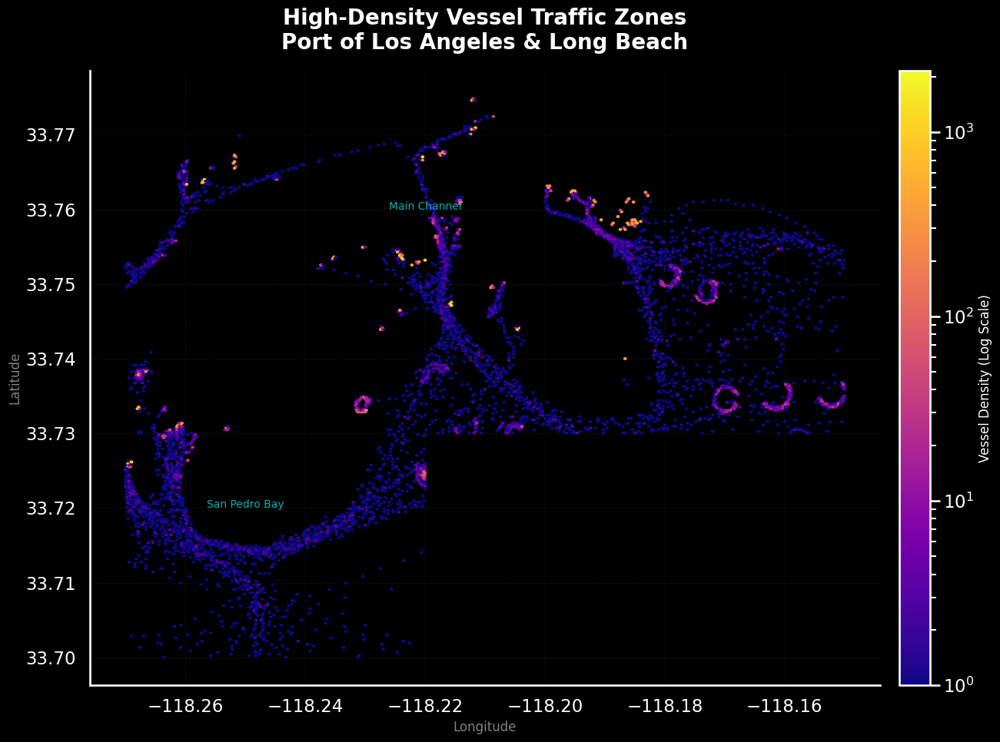

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# 1. Load data
df = pd.read_csv('la_long_beach_data.csv')

# 2. Filter for the specific area of interest to remove noise
# (Keeps focus tight on the port area)
df_filtered = df[(df['LAT'] > 33.65) & (df['LAT'] < 33.85) &
                 (df['LON'] > -118.35) & (df['LON'] < -118.15)]

# 3. Set a Dark Background for high contrast
plt.style.use('dark_background')

# 4. Create the Plot
fig, ax = plt.subplots(figsize=(14, 10))

# Hexbin Plot
# 'gridsize=300': High resolution
# 'cmap='plasma'': Purple-to-Yellow neon gradient
# 'bins='log'': Highlights both faint trails and heavy congestion
hb = ax.hexbin(df_filtered['LON'], df_filtered['LAT'], 
               gridsize=300, 
               cmap='plasma', 
               mincnt=1, 
               bins='log')

# 5. Styling & Details
# Add Colorbar
cb = fig.colorbar(hb, ax=ax, pad=0.02)
cb.set_label('Vessel Density (Log Scale)', fontsize=12, color='white')

# Titles and Labels
ax.set_title('High-Density Vessel Traffic Zones\nPort of Los Angeles & Long Beach', 
             fontsize=20, color='white', pad=20, weight='bold')
ax.set_xlabel('Longitude', fontsize=12, color='gray')
ax.set_ylabel('Latitude', fontsize=12, color='gray')

# Subtle Grid
ax.grid(True, linestyle=':', linewidth=0.5, alpha=0.3, color='gray')

# Remove heavy borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Add Annotations for Context (Approximate locations)
ax.text(-118.25, 33.72, 'San Pedro Bay', color='cyan', fontsize=10, alpha=0.7, ha='center')
ax.text(-118.22, 33.76, 'Main Channel', color='cyan', fontsize=10, alpha=0.7, ha='center')

# 6. Save High-Res Image
plt.tight_layout()
plt.savefig('polished_density_heatmap.png', dpi=300, facecolor='black')
plt.show()

C:\Users\sadiq\AppData\Local\Temp\ipykernel_5060\283633408.py:42: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




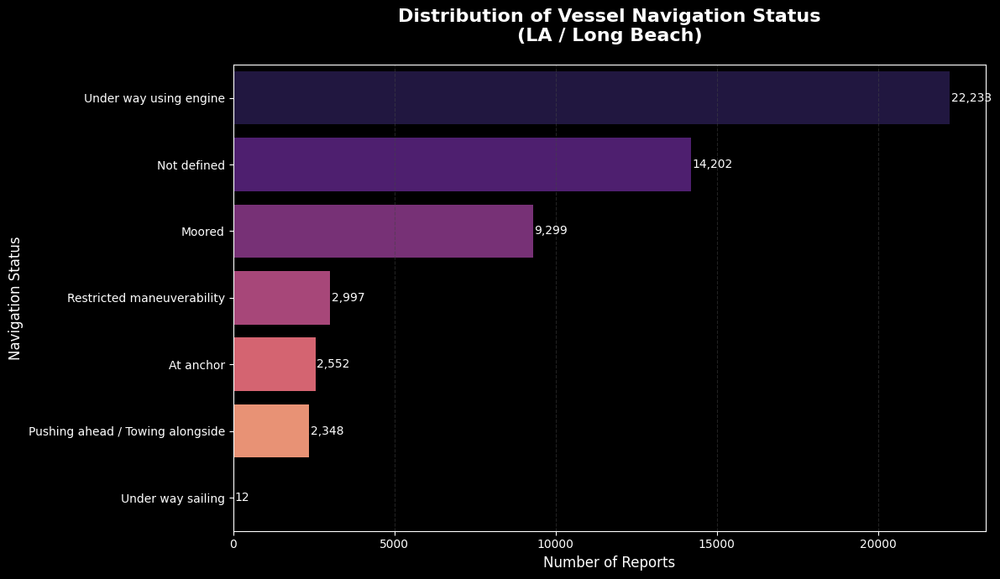

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the dataset
df = pd.read_csv('la_long_beach_data.csv')

# 2. Define the AIS Navigation Status Map
# (Standard mappings based on ITU-R M.1371)
status_map = {
    0: 'Under way using engine',
    1: 'At anchor',
    2: 'Not under command',
    3: 'Restricted maneuverability',
    4: 'Constrained by her draught',
    5: 'Moored',
    6: 'Aground',
    7: 'Engaged in Fishing',
    8: 'Under way sailing',
    15: 'Not defined',
    # Regional or older specific definitions often found in US waters
    11: 'Towing astern',
    12: 'Pushing ahead / Towing alongside'
}

# 3. Apply the mapping
# Fill missing values with 15 (Not defined) and map to text
df['Status_Label'] = df['Status'].fillna(15).astype(int).map(status_map)

# Fill any remaining unmapped codes
df['Status_Label'] = df['Status_Label'].fillna('Other / Reserved')

# 4. Count the data
status_counts = df['Status_Label'].value_counts().reset_index()
status_counts.columns = ['Navigation Status', 'Count']

# 5. Create the Plot
plt.figure(figsize=(12, 7))
plt.style.use('dark_background') # Consistent dark theme

# Draw Horizontal Bar Chart
sns.barplot(data=status_counts, x='Count', y='Navigation Status', palette='magma')

# Add Titles and Labels
plt.title('Distribution of Vessel Navigation Status\n(LA / Long Beach)', fontsize=16, pad=20, weight='bold')
plt.xlabel('Number of Reports', fontsize=12)
plt.ylabel('Navigation Status', fontsize=12)

# Add text labels to the bars for readability
for i, v in enumerate(status_counts['Count']):
    plt.text(v + 50, i, f"{v:,}", color='white', va='center', fontsize=10)

plt.grid(axis='x', color='#444444', linestyle='--', alpha=0.5)
plt.tight_layout()

# 6. Save and Show
plt.savefig('navigation_status_bar.png')
plt.show()

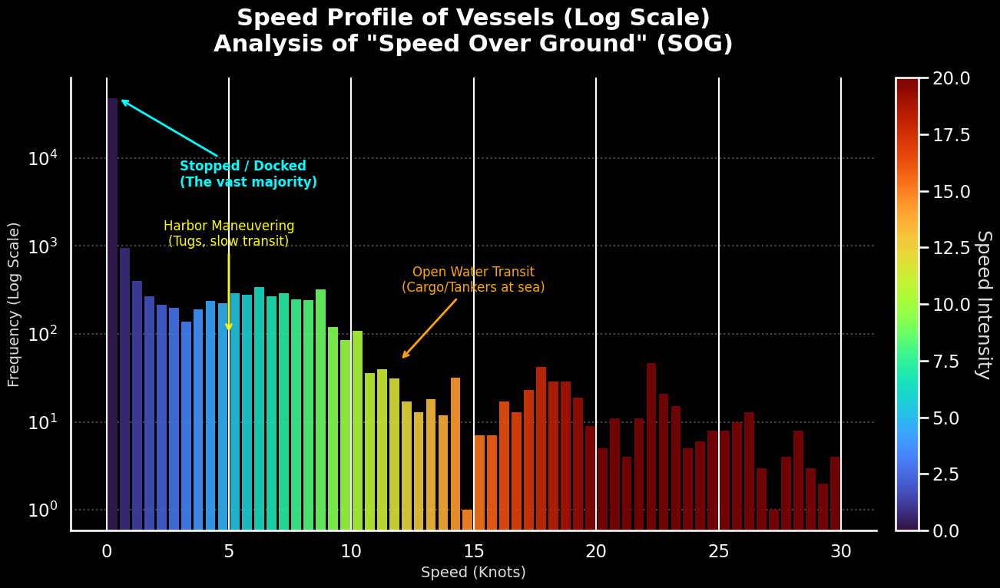

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# 1. Load Data
df = pd.read_csv('la_long_beach_data.csv')

# 2. Setup Dark Theme
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(14, 8))

# 3. Create Custom Histogram Data
# We limit the range to 0-30 knots to focus on relevant speeds
counts, bins = np.histogram(df['SOG'], bins=60, range=(0, 30))
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# 4. Color Mapping
# Map the speed values to a color gradient ('turbo' is high contrast)
norm = plt.Normalize(0, 20)
colors = cm.turbo(norm(bin_centers))

# 5. Plot the Bars
# Width=0.4 creates nice gaps between bars
ax.bar(bin_centers, counts, width=0.4, color=colors, edgecolor='none', alpha=0.9)

# 6. CRITICAL: Log Scale for Y-Axis
# This allows us to see the small number of moving ships compared to the huge number of docked ones
ax.set_yscale('log')

# 7. Labels and Annotations
ax.set_title('Speed Profile of Vessels (Log Scale)\nAnalysis of "Speed Over Ground" (SOG)', 
             fontsize=22, color='white', pad=25, weight='bold')
ax.set_xlabel('Speed (Knots)', fontsize=14, color='#dddddd')
ax.set_ylabel('Frequency (Log Scale)', fontsize=14, color='#dddddd')

# Annotate the "Parking Lot"
ax.annotate('Stopped / Docked\n(The vast majority)', 
            xy=(0.5, counts[0]), 
            xytext=(3, counts[0]/10),
            arrowprops=dict(arrowstyle="->", color='cyan', lw=2),
            fontsize=12, color='cyan', fontweight='bold')

# Annotate Maneuvering
ax.annotate('Harbor Maneuvering\n(Tugs, slow transit)', 
            xy=(5, 100), 
            xytext=(5, 1000),
            arrowprops=dict(arrowstyle="->", color='yellow', lw=2),
            fontsize=12, color='yellow', ha='center')

# Annotate Cruising
ax.annotate('Open Water Transit\n(Cargo/Tankers at sea)', 
            xy=(12, 50), 
            xytext=(15, 300),
            arrowprops=dict(arrowstyle="->", color='orange', lw=2),
            fontsize=12, color='orange', ha='center')

# 8. Clean up
ax.grid(True, which='major', axis='y', linestyle=':', color='white', alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Add Colorbar
sm = cm.ScalarMappable(cmap='turbo', norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label('Speed Intensity', rotation=270, labelpad=20, color='#dddddd')

plt.tight_layout()
plt.savefig('polished_speed_histogram.png', dpi=300, facecolor='black')
plt.show()